# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [15]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [16]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [17]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [18]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [19]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_model.summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [20]:
from tensorflow import keras

multi_channel_cnn_model.compile(loss='mae', optimizer='adam')

# Train model

In [21]:
history = multi_channel_cnn_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 102.5499 - val_loss: 46.8944
Epoch 2/2000
10/10 - 0s - loss: 41.8075 - val_loss: 48.0946
Epoch 3/2000
10/10 - 0s - loss: 28.9411 - val_loss: 43.7562
Epoch 4/2000
10/10 - 0s - loss: 23.8254 - val_loss: 40.8332
Epoch 5/2000
10/10 - 0s - loss: 21.8106 - val_loss: 45.6992
Epoch 6/2000
10/10 - 0s - loss: 16.7788 - val_loss: 43.2011
Epoch 7/2000
10/10 - 0s - loss: 16.1914 - val_loss: 47.5165
Epoch 8/2000
10/10 - 0s - loss: 14.4628 - val_loss: 45.2228
Epoch 9/2000
10/10 - 0s - loss: 14.8609 - val_loss: 47.3657
Epoch 10/2000
10/10 - 0s - loss: 12.2496 - val_loss: 48.1321
Epoch 11/2000
10/10 - 0s - loss: 12.7958 - val_loss: 48.2683
Epoch 12/2000
10/10 - 0s - loss: 11.8948 - val_loss: 49.1908
Epoch 13/2000
10/10 - 0s - loss: 11.4755 - val_loss: 48.9078
Epoch 14/2000
10/10 - 0s - loss: 11.8128 - val_loss: 48.1814
Epoch 15/2000
10/10 - 0s - loss: 12.1015 - val_loss: 45.0883
Epoch 16/2000
10/10 - 0s - loss: 13.6259 - val_loss: 47.6675
Epoch 17/2000
10/10 - 0s - loss:

Epoch 137/2000
10/10 - 0s - loss: 7.2354 - val_loss: 48.0998
Epoch 138/2000
10/10 - 0s - loss: 7.7037 - val_loss: 49.2646
Epoch 139/2000
10/10 - 0s - loss: 7.1298 - val_loss: 49.1314
Epoch 140/2000
10/10 - 0s - loss: 7.5295 - val_loss: 48.4133
Epoch 141/2000
10/10 - 0s - loss: 8.0335 - val_loss: 49.0533
Epoch 142/2000
10/10 - 0s - loss: 6.7764 - val_loss: 49.4090
Epoch 143/2000
10/10 - 0s - loss: 6.8709 - val_loss: 50.0948
Epoch 144/2000
10/10 - 0s - loss: 6.7458 - val_loss: 49.0005
Epoch 145/2000
10/10 - 0s - loss: 6.8287 - val_loss: 48.8994
Epoch 146/2000
10/10 - 0s - loss: 7.0670 - val_loss: 48.5383
Epoch 147/2000
10/10 - 0s - loss: 8.0691 - val_loss: 50.1065
Epoch 148/2000
10/10 - 0s - loss: 6.3489 - val_loss: 50.5688
Epoch 149/2000
10/10 - 0s - loss: 6.2709 - val_loss: 50.8935
Epoch 150/2000
10/10 - 0s - loss: 6.4386 - val_loss: 51.5648
Epoch 151/2000
10/10 - 0s - loss: 6.4553 - val_loss: 51.2059
Epoch 152/2000
10/10 - 0s - loss: 6.7623 - val_loss: 51.1770
Epoch 153/2000
10/10 - 0

Epoch 272/2000
10/10 - 0s - loss: 6.7643 - val_loss: 48.4462
Epoch 273/2000
10/10 - 0s - loss: 6.9308 - val_loss: 49.4128
Epoch 274/2000
10/10 - 0s - loss: 5.9227 - val_loss: 49.0264
Epoch 275/2000
10/10 - 0s - loss: 6.6500 - val_loss: 49.7682
Epoch 276/2000
10/10 - 0s - loss: 5.9004 - val_loss: 48.9603
Epoch 277/2000
10/10 - 0s - loss: 6.8854 - val_loss: 48.7701
Epoch 278/2000
10/10 - 0s - loss: 6.1331 - val_loss: 48.3702
Epoch 279/2000
10/10 - 0s - loss: 7.4165 - val_loss: 47.6758
Epoch 280/2000
10/10 - 0s - loss: 6.7938 - val_loss: 48.1080
Epoch 281/2000
10/10 - 0s - loss: 7.1443 - val_loss: 48.2122
Epoch 282/2000
10/10 - 0s - loss: 6.7303 - val_loss: 48.6882
Epoch 283/2000
10/10 - 0s - loss: 6.6246 - val_loss: 49.0854
Epoch 284/2000
10/10 - 0s - loss: 5.9901 - val_loss: 49.1111
Epoch 285/2000
10/10 - 0s - loss: 6.3388 - val_loss: 49.2307
Epoch 286/2000
10/10 - 0s - loss: 6.3608 - val_loss: 48.7993
Epoch 287/2000
10/10 - 0s - loss: 6.3596 - val_loss: 48.0767
Epoch 288/2000
10/10 - 0

Epoch 407/2000
10/10 - 0s - loss: 6.1675 - val_loss: 48.4277
Epoch 408/2000
10/10 - 0s - loss: 6.7457 - val_loss: 47.2656
Epoch 409/2000
10/10 - 0s - loss: 6.5533 - val_loss: 48.0453
Epoch 410/2000
10/10 - 0s - loss: 5.8291 - val_loss: 49.0507
Epoch 411/2000
10/10 - 0s - loss: 5.5704 - val_loss: 49.2766
Epoch 412/2000
10/10 - 0s - loss: 6.2657 - val_loss: 48.6187
Epoch 413/2000
10/10 - 0s - loss: 6.1004 - val_loss: 49.1823
Epoch 414/2000
10/10 - 0s - loss: 5.4262 - val_loss: 48.6532
Epoch 415/2000
10/10 - 0s - loss: 5.7973 - val_loss: 48.6299
Epoch 416/2000
10/10 - 0s - loss: 5.9360 - val_loss: 48.3787
Epoch 417/2000
10/10 - 0s - loss: 5.5877 - val_loss: 47.9608
Epoch 418/2000
10/10 - 0s - loss: 6.2615 - val_loss: 48.7076
Epoch 419/2000
10/10 - 0s - loss: 6.5066 - val_loss: 49.5361
Epoch 420/2000
10/10 - 0s - loss: 6.0495 - val_loss: 49.6344
Epoch 421/2000
10/10 - 0s - loss: 5.6084 - val_loss: 49.0792
Epoch 422/2000
10/10 - 0s - loss: 5.4148 - val_loss: 48.1201
Epoch 423/2000
10/10 - 0

Epoch 542/2000
10/10 - 0s - loss: 4.7969 - val_loss: 58.3876
Epoch 543/2000
10/10 - 0s - loss: 5.2681 - val_loss: 60.1356
Epoch 544/2000
10/10 - 0s - loss: 5.4486 - val_loss: 61.0108
Epoch 545/2000
10/10 - 0s - loss: 5.2206 - val_loss: 61.2177
Epoch 546/2000
10/10 - 0s - loss: 5.3781 - val_loss: 59.5325
Epoch 547/2000
10/10 - 0s - loss: 4.9920 - val_loss: 59.0763
Epoch 548/2000
10/10 - 0s - loss: 5.4651 - val_loss: 61.1535
Epoch 549/2000
10/10 - 0s - loss: 5.4477 - val_loss: 62.1267
Epoch 550/2000
10/10 - 0s - loss: 5.6354 - val_loss: 61.1019
Epoch 551/2000
10/10 - 0s - loss: 5.8003 - val_loss: 58.5333
Epoch 552/2000
10/10 - 0s - loss: 5.3781 - val_loss: 57.9262
Epoch 553/2000
10/10 - 0s - loss: 5.6438 - val_loss: 56.5660
Epoch 554/2000
10/10 - 0s - loss: 5.9530 - val_loss: 55.6999
Epoch 555/2000
10/10 - 0s - loss: 5.5909 - val_loss: 55.4681
Epoch 556/2000
10/10 - 0s - loss: 5.2917 - val_loss: 56.9682
Epoch 557/2000
10/10 - 0s - loss: 6.0326 - val_loss: 54.7589
Epoch 558/2000
10/10 - 0

Epoch 677/2000
10/10 - 0s - loss: 5.6649 - val_loss: 61.3809
Epoch 678/2000
10/10 - 0s - loss: 5.6744 - val_loss: 59.3439
Epoch 679/2000
10/10 - 0s - loss: 5.4879 - val_loss: 59.3127
Epoch 680/2000
10/10 - 0s - loss: 5.4957 - val_loss: 61.1443
Epoch 681/2000
10/10 - 0s - loss: 5.3009 - val_loss: 60.4568
Epoch 682/2000
10/10 - 0s - loss: 5.2605 - val_loss: 61.7672
Epoch 683/2000
10/10 - 0s - loss: 5.4505 - val_loss: 63.3350
Epoch 684/2000
10/10 - 0s - loss: 5.2785 - val_loss: 61.5556
Epoch 685/2000
10/10 - 0s - loss: 5.3092 - val_loss: 60.6305
Epoch 686/2000
10/10 - 0s - loss: 5.6066 - val_loss: 59.2982
Epoch 687/2000
10/10 - 0s - loss: 5.8816 - val_loss: 50.7682
Epoch 688/2000
10/10 - 0s - loss: 5.3967 - val_loss: 50.7773
Epoch 689/2000
10/10 - 0s - loss: 5.1624 - val_loss: 51.1243
Epoch 690/2000
10/10 - 0s - loss: 5.3762 - val_loss: 51.0944
Epoch 691/2000
10/10 - 0s - loss: 4.8758 - val_loss: 52.1611
Epoch 692/2000
10/10 - 0s - loss: 4.9799 - val_loss: 51.7545
Epoch 693/2000
10/10 - 0

Epoch 812/2000
10/10 - 0s - loss: 4.7870 - val_loss: 52.0219
Epoch 813/2000
10/10 - 0s - loss: 5.7423 - val_loss: 50.9768
Epoch 814/2000
10/10 - 0s - loss: 5.2867 - val_loss: 52.2749
Epoch 815/2000
10/10 - 0s - loss: 5.5668 - val_loss: 52.5650
Epoch 816/2000
10/10 - 0s - loss: 4.9447 - val_loss: 51.4572
Epoch 817/2000
10/10 - 0s - loss: 4.8552 - val_loss: 51.6924
Epoch 818/2000
10/10 - 0s - loss: 4.8925 - val_loss: 52.7112
Epoch 819/2000
10/10 - 0s - loss: 4.7507 - val_loss: 52.8353
Epoch 820/2000
10/10 - 0s - loss: 5.7393 - val_loss: 51.9966
Epoch 821/2000
10/10 - 0s - loss: 5.0235 - val_loss: 51.2491
Epoch 822/2000
10/10 - 0s - loss: 4.6977 - val_loss: 50.6713
Epoch 823/2000
10/10 - 0s - loss: 4.9735 - val_loss: 50.1978
Epoch 824/2000
10/10 - 0s - loss: 5.0692 - val_loss: 51.6730
Epoch 825/2000
10/10 - 0s - loss: 5.1723 - val_loss: 50.6372
Epoch 826/2000
10/10 - 0s - loss: 4.9588 - val_loss: 50.3024
Epoch 827/2000
10/10 - 0s - loss: 5.2441 - val_loss: 50.6477
Epoch 828/2000
10/10 - 0

Epoch 947/2000
10/10 - 0s - loss: 5.0098 - val_loss: 64.8832
Epoch 948/2000
10/10 - 0s - loss: 5.1586 - val_loss: 71.0566
Epoch 949/2000
10/10 - 0s - loss: 4.7907 - val_loss: 78.5844
Epoch 950/2000
10/10 - 0s - loss: 5.4178 - val_loss: 77.8466
Epoch 951/2000
10/10 - 0s - loss: 5.1484 - val_loss: 68.0193
Epoch 952/2000
10/10 - 0s - loss: 5.7618 - val_loss: 60.7275
Epoch 953/2000
10/10 - 0s - loss: 5.3261 - val_loss: 56.2868
Epoch 954/2000
10/10 - 0s - loss: 5.5556 - val_loss: 58.7810
Epoch 955/2000
10/10 - 0s - loss: 5.1766 - val_loss: 61.4965
Epoch 956/2000
10/10 - 0s - loss: 5.6878 - val_loss: 59.1441
Epoch 957/2000
10/10 - 0s - loss: 5.1141 - val_loss: 55.2731
Epoch 958/2000
10/10 - 0s - loss: 5.8916 - val_loss: 56.5324
Epoch 959/2000
10/10 - 0s - loss: 5.4237 - val_loss: 56.7939
Epoch 960/2000
10/10 - 0s - loss: 4.9092 - val_loss: 56.3123
Epoch 961/2000
10/10 - 0s - loss: 5.3909 - val_loss: 58.7857
Epoch 962/2000
10/10 - 0s - loss: 5.3397 - val_loss: 57.1728
Epoch 963/2000
10/10 - 0

Epoch 1080/2000
10/10 - 0s - loss: 5.1020 - val_loss: 68.1602
Epoch 1081/2000
10/10 - 0s - loss: 4.9253 - val_loss: 63.1364
Epoch 1082/2000
10/10 - 0s - loss: 5.9411 - val_loss: 60.5096
Epoch 1083/2000
10/10 - 0s - loss: 5.7891 - val_loss: 62.3514
Epoch 1084/2000
10/10 - 0s - loss: 5.5724 - val_loss: 63.3013
Epoch 1085/2000
10/10 - 0s - loss: 6.3140 - val_loss: 65.0816
Epoch 1086/2000
10/10 - 0s - loss: 5.4501 - val_loss: 67.5542
Epoch 1087/2000
10/10 - 0s - loss: 5.0261 - val_loss: 72.6108
Epoch 1088/2000
10/10 - 0s - loss: 5.0773 - val_loss: 74.3417
Epoch 1089/2000
10/10 - 0s - loss: 5.1403 - val_loss: 76.7736
Epoch 1090/2000
10/10 - 0s - loss: 5.4763 - val_loss: 76.9309
Epoch 1091/2000
10/10 - 0s - loss: 5.3035 - val_loss: 81.6028
Epoch 1092/2000
10/10 - 0s - loss: 5.2831 - val_loss: 87.8415
Epoch 1093/2000
10/10 - 0s - loss: 5.2314 - val_loss: 92.6103
Epoch 1094/2000
10/10 - 0s - loss: 5.7576 - val_loss: 95.5892
Epoch 1095/2000
10/10 - 0s - loss: 5.1720 - val_loss: 93.8476
Epoch 10

Epoch 1211/2000
10/10 - 0s - loss: 5.7491 - val_loss: 119.5541
Epoch 1212/2000
10/10 - 0s - loss: 5.6536 - val_loss: 115.1456
Epoch 1213/2000
10/10 - 0s - loss: 5.2149 - val_loss: 114.2133
Epoch 1214/2000
10/10 - 0s - loss: 5.7810 - val_loss: 113.2022
Epoch 1215/2000
10/10 - 0s - loss: 5.5815 - val_loss: 103.0048
Epoch 1216/2000
10/10 - 0s - loss: 5.6720 - val_loss: 100.3295
Epoch 1217/2000
10/10 - 0s - loss: 5.1097 - val_loss: 101.9385
Epoch 1218/2000
10/10 - 0s - loss: 4.9444 - val_loss: 102.5250
Epoch 1219/2000
10/10 - 0s - loss: 5.0666 - val_loss: 95.7831
Epoch 1220/2000
10/10 - 0s - loss: 4.8728 - val_loss: 94.4855
Epoch 1221/2000
10/10 - 0s - loss: 5.0579 - val_loss: 92.5054
Epoch 1222/2000
10/10 - 0s - loss: 4.6506 - val_loss: 91.8911
Epoch 1223/2000
10/10 - 0s - loss: 4.7118 - val_loss: 98.8762
Epoch 1224/2000
10/10 - 0s - loss: 5.1677 - val_loss: 95.9771
Epoch 1225/2000
10/10 - 0s - loss: 4.6666 - val_loss: 97.3673
Epoch 1226/2000
10/10 - 0s - loss: 4.5220 - val_loss: 107.4352

10/10 - 0s - loss: 5.6927 - val_loss: 68.3314
Epoch 1343/2000
10/10 - 0s - loss: 5.4790 - val_loss: 69.7214
Epoch 1344/2000
10/10 - 0s - loss: 5.6238 - val_loss: 71.9312
Epoch 1345/2000
10/10 - 0s - loss: 5.3887 - val_loss: 71.9976
Epoch 1346/2000
10/10 - 0s - loss: 5.2861 - val_loss: 66.8509
Epoch 1347/2000
10/10 - 0s - loss: 5.7996 - val_loss: 65.6298
Epoch 1348/2000
10/10 - 0s - loss: 5.2989 - val_loss: 66.7584
Epoch 1349/2000
10/10 - 0s - loss: 5.5811 - val_loss: 63.8066
Epoch 1350/2000
10/10 - 0s - loss: 5.2482 - val_loss: 66.1158
Epoch 1351/2000
10/10 - 0s - loss: 5.0160 - val_loss: 67.5781
Epoch 1352/2000
10/10 - 0s - loss: 4.9604 - val_loss: 69.4763
Epoch 1353/2000
10/10 - 0s - loss: 5.3178 - val_loss: 74.5250
Epoch 1354/2000
10/10 - 0s - loss: 5.9181 - val_loss: 72.8926
Epoch 1355/2000
10/10 - 0s - loss: 6.3258 - val_loss: 73.1922
Epoch 1356/2000
10/10 - 0s - loss: 6.0054 - val_loss: 71.9107
Epoch 1357/2000
10/10 - 0s - loss: 5.2446 - val_loss: 72.9152
Epoch 1358/2000
10/10 - 

10/10 - 0s - loss: 4.8911 - val_loss: 97.2542
Epoch 1475/2000
10/10 - 0s - loss: 5.6208 - val_loss: 97.3375
Epoch 1476/2000
10/10 - 0s - loss: 5.4193 - val_loss: 97.3339
Epoch 1477/2000
10/10 - 0s - loss: 5.2259 - val_loss: 104.5621
Epoch 1478/2000
10/10 - 0s - loss: 5.1984 - val_loss: 106.8916
Epoch 1479/2000
10/10 - 0s - loss: 5.1974 - val_loss: 94.1046
Epoch 1480/2000
10/10 - 0s - loss: 5.1782 - val_loss: 83.7648
Epoch 1481/2000
10/10 - 0s - loss: 4.8186 - val_loss: 83.3366
Epoch 1482/2000
10/10 - 0s - loss: 5.3906 - val_loss: 86.7602
Epoch 1483/2000
10/10 - 0s - loss: 5.0042 - val_loss: 78.4330
Epoch 1484/2000
10/10 - 0s - loss: 5.3168 - val_loss: 66.5694
Epoch 1485/2000
10/10 - 0s - loss: 5.5902 - val_loss: 67.6328
Epoch 1486/2000
10/10 - 0s - loss: 4.9143 - val_loss: 75.0301
Epoch 1487/2000
10/10 - 0s - loss: 4.9479 - val_loss: 81.6791
Epoch 1488/2000
10/10 - 0s - loss: 4.9294 - val_loss: 88.6863
Epoch 1489/2000
10/10 - 0s - loss: 5.1713 - val_loss: 90.0172
Epoch 1490/2000
10/10 

Epoch 1607/2000
10/10 - 0s - loss: 5.1968 - val_loss: 72.1520
Epoch 1608/2000
10/10 - 0s - loss: 5.2249 - val_loss: 76.0891
Epoch 1609/2000
10/10 - 0s - loss: 5.3763 - val_loss: 84.8920
Epoch 1610/2000
10/10 - 0s - loss: 4.9103 - val_loss: 91.1039
Epoch 1611/2000
10/10 - 0s - loss: 4.9612 - val_loss: 101.8193
Epoch 1612/2000
10/10 - 0s - loss: 4.8585 - val_loss: 104.1706
Epoch 1613/2000
10/10 - 0s - loss: 5.2674 - val_loss: 94.2528
Epoch 1614/2000
10/10 - 0s - loss: 4.8416 - val_loss: 81.3215
Epoch 1615/2000
10/10 - 0s - loss: 5.0515 - val_loss: 74.0519
Epoch 1616/2000
10/10 - 0s - loss: 4.9224 - val_loss: 73.2209
Epoch 1617/2000
10/10 - 0s - loss: 4.8261 - val_loss: 70.2590
Epoch 1618/2000
10/10 - 0s - loss: 4.7500 - val_loss: 71.4753
Epoch 1619/2000
10/10 - 0s - loss: 5.0669 - val_loss: 73.6001
Epoch 1620/2000
10/10 - 0s - loss: 4.5446 - val_loss: 79.5235
Epoch 1621/2000
10/10 - 0s - loss: 4.5525 - val_loss: 86.9422
Epoch 1622/2000
10/10 - 0s - loss: 4.6904 - val_loss: 81.2222
Epoch 

Epoch 1740/2000
10/10 - 0s - loss: 5.1662 - val_loss: 64.2355
Epoch 1741/2000
10/10 - 0s - loss: 4.4112 - val_loss: 60.4969
Epoch 1742/2000
10/10 - 0s - loss: 4.7301 - val_loss: 66.3073
Epoch 1743/2000
10/10 - 0s - loss: 4.7302 - val_loss: 77.7517
Epoch 1744/2000
10/10 - 0s - loss: 5.3921 - val_loss: 85.4050
Epoch 1745/2000
10/10 - 0s - loss: 5.1313 - val_loss: 89.2069
Epoch 1746/2000
10/10 - 0s - loss: 4.9622 - val_loss: 93.1124
Epoch 1747/2000
10/10 - 0s - loss: 5.2688 - val_loss: 93.3069
Epoch 1748/2000
10/10 - 0s - loss: 4.8348 - val_loss: 90.8805
Epoch 1749/2000
10/10 - 0s - loss: 5.3111 - val_loss: 94.2475
Epoch 1750/2000
10/10 - 0s - loss: 5.9449 - val_loss: 112.9949
Epoch 1751/2000
10/10 - 0s - loss: 5.6551 - val_loss: 128.0297
Epoch 1752/2000
10/10 - 0s - loss: 5.4414 - val_loss: 116.5266
Epoch 1753/2000
10/10 - 0s - loss: 5.3024 - val_loss: 103.0243
Epoch 1754/2000
10/10 - 0s - loss: 4.7689 - val_loss: 103.3182
Epoch 1755/2000
10/10 - 0s - loss: 5.1670 - val_loss: 98.6655
Epo

Epoch 1872/2000
10/10 - 0s - loss: 5.1346 - val_loss: 80.1929
Epoch 1873/2000
10/10 - 0s - loss: 4.8891 - val_loss: 82.2966
Epoch 1874/2000
10/10 - 0s - loss: 5.3917 - val_loss: 86.9160
Epoch 1875/2000
10/10 - 0s - loss: 5.1221 - val_loss: 96.3480
Epoch 1876/2000
10/10 - 0s - loss: 4.8285 - val_loss: 104.3122
Epoch 1877/2000
10/10 - 0s - loss: 4.9729 - val_loss: 111.7399
Epoch 1878/2000
10/10 - 0s - loss: 4.9775 - val_loss: 115.3199
Epoch 1879/2000
10/10 - 0s - loss: 4.9243 - val_loss: 118.2592
Epoch 1880/2000
10/10 - 0s - loss: 5.0791 - val_loss: 121.1621
Epoch 1881/2000
10/10 - 0s - loss: 4.3395 - val_loss: 123.4969
Epoch 1882/2000
10/10 - 0s - loss: 4.7428 - val_loss: 132.6025
Epoch 1883/2000
10/10 - 0s - loss: 4.9677 - val_loss: 128.4448
Epoch 1884/2000
10/10 - 0s - loss: 4.7429 - val_loss: 114.4520
Epoch 1885/2000
10/10 - 0s - loss: 5.4392 - val_loss: 110.8491
Epoch 1886/2000
10/10 - 0s - loss: 5.0271 - val_loss: 102.9367
Epoch 1887/2000
10/10 - 0s - loss: 5.0704 - val_loss: 103.1

# Plot model loss and validation loss

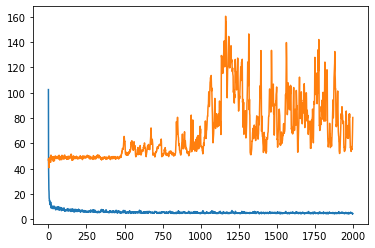

In [22]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [23]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [24]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 54.12990745093875


# Make predictions based on test set and get a root mean squared error 

In [25]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [26]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 264.5796354018368


# Plot train labels along with train predictions

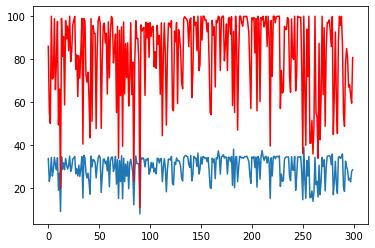

In [27]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

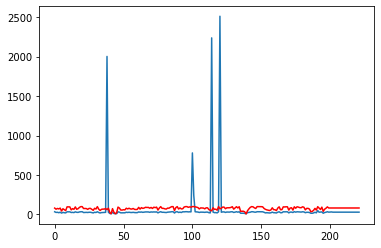

In [28]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [29]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [30]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [31]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [32]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [33]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [34]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [35]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [36]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [37]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [38]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [39]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [40]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [41]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [42]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [43]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [44]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [45]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [46]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_norm_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_norm_model.summary())

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [47]:
from tensorflow import keras

multi_channel_cnn_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [48]:
history = multi_channel_cnn_norm_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.5431 - val_loss: 0.2189
Epoch 2/2000
10/10 - 0s - loss: 0.3794 - val_loss: 0.4200
Epoch 3/2000
10/10 - 0s - loss: 0.2902 - val_loss: 0.2661
Epoch 4/2000
10/10 - 0s - loss: 0.2184 - val_loss: 0.2755
Epoch 5/2000
10/10 - 0s - loss: 0.2022 - val_loss: 0.2408
Epoch 6/2000
10/10 - 0s - loss: 0.1859 - val_loss: 0.2247
Epoch 7/2000
10/10 - 0s - loss: 0.1743 - val_loss: 0.1922
Epoch 8/2000
10/10 - 0s - loss: 0.1829 - val_loss: 0.1936
Epoch 9/2000
10/10 - 0s - loss: 0.1768 - val_loss: 0.1905
Epoch 10/2000
10/10 - 0s - loss: 0.1727 - val_loss: 0.1778
Epoch 11/2000
10/10 - 0s - loss: 0.1705 - val_loss: 0.1810
Epoch 12/2000
10/10 - 0s - loss: 0.1741 - val_loss: 0.1728
Epoch 13/2000
10/10 - 0s - loss: 0.1731 - val_loss: 0.1700
Epoch 14/2000
10/10 - 0s - loss: 0.1709 - val_loss: 0.1650
Epoch 15/2000
10/10 - 0s - loss: 0.1680 - val_loss: 0.1661
Epoch 16/2000
10/10 - 0s - loss: 0.1701 - val_loss: 0.1599
Epoch 17/2000
10/10 - 0s - loss: 0.1694 - val_loss: 0.1611
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1315 - val_loss: 0.1621
Epoch 141/2000
10/10 - 0s - loss: 0.1344 - val_loss: 0.1564
Epoch 142/2000
10/10 - 0s - loss: 0.1348 - val_loss: 0.1600
Epoch 143/2000
10/10 - 0s - loss: 0.1330 - val_loss: 0.1635
Epoch 144/2000
10/10 - 0s - loss: 0.1357 - val_loss: 0.1553
Epoch 145/2000
10/10 - 0s - loss: 0.1309 - val_loss: 0.1553
Epoch 146/2000
10/10 - 0s - loss: 0.1339 - val_loss: 0.1582
Epoch 147/2000
10/10 - 0s - loss: 0.1357 - val_loss: 0.1551
Epoch 148/2000
10/10 - 0s - loss: 0.1348 - val_loss: 0.1503
Epoch 149/2000
10/10 - 0s - loss: 0.1406 - val_loss: 0.1692
Epoch 150/2000
10/10 - 0s - loss: 0.1405 - val_loss: 0.1501
Epoch 151/2000
10/10 - 0s - loss: 0.1331 - val_loss: 0.1481
Epoch 152/2000
10/10 - 0s - loss: 0.1362 - val_loss: 0.1553
Epoch 153/2000
10/10 - 0s - loss: 0.1357 - val_loss: 0.1511
Epoch 154/2000
10/10 - 0s - loss: 0.1361 - val_loss: 0.1509
Epoch 155/2000
10/10 - 0s - loss: 0.1291 - val_loss: 0.1538
Epoch 156/2000
10/10 - 0s - loss: 0.1335

Epoch 277/2000
10/10 - 0s - loss: 0.1176 - val_loss: 0.1648
Epoch 278/2000
10/10 - 0s - loss: 0.1191 - val_loss: 0.1582
Epoch 279/2000
10/10 - 0s - loss: 0.1132 - val_loss: 0.1538
Epoch 280/2000
10/10 - 0s - loss: 0.1166 - val_loss: 0.1620
Epoch 281/2000
10/10 - 0s - loss: 0.1229 - val_loss: 0.1601
Epoch 282/2000
10/10 - 0s - loss: 0.1252 - val_loss: 0.1485
Epoch 283/2000
10/10 - 0s - loss: 0.1219 - val_loss: 0.1617
Epoch 284/2000
10/10 - 0s - loss: 0.1225 - val_loss: 0.1607
Epoch 285/2000
10/10 - 0s - loss: 0.1139 - val_loss: 0.1566
Epoch 286/2000
10/10 - 0s - loss: 0.1119 - val_loss: 0.1623
Epoch 287/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.1694
Epoch 288/2000
10/10 - 0s - loss: 0.1189 - val_loss: 0.1623
Epoch 289/2000
10/10 - 0s - loss: 0.1187 - val_loss: 0.1554
Epoch 290/2000
10/10 - 0s - loss: 0.1195 - val_loss: 0.1606
Epoch 291/2000
10/10 - 0s - loss: 0.1235 - val_loss: 0.1550
Epoch 292/2000
10/10 - 0s - loss: 0.1158 - val_loss: 0.1546
Epoch 293/2000
10/10 - 0s - loss: 0.1246

Epoch 414/2000
10/10 - 0s - loss: 0.1071 - val_loss: 0.1572
Epoch 415/2000
10/10 - 0s - loss: 0.1054 - val_loss: 0.1750
Epoch 416/2000
10/10 - 0s - loss: 0.1100 - val_loss: 0.1668
Epoch 417/2000
10/10 - 0s - loss: 0.1067 - val_loss: 0.1667
Epoch 418/2000
10/10 - 0s - loss: 0.1100 - val_loss: 0.1671
Epoch 419/2000
10/10 - 0s - loss: 0.1040 - val_loss: 0.1624
Epoch 420/2000
10/10 - 0s - loss: 0.1089 - val_loss: 0.1672
Epoch 421/2000
10/10 - 0s - loss: 0.1080 - val_loss: 0.1724
Epoch 422/2000
10/10 - 0s - loss: 0.1126 - val_loss: 0.1617
Epoch 423/2000
10/10 - 0s - loss: 0.1015 - val_loss: 0.1608
Epoch 424/2000
10/10 - 0s - loss: 0.1142 - val_loss: 0.1813
Epoch 425/2000
10/10 - 0s - loss: 0.1126 - val_loss: 0.1736
Epoch 426/2000
10/10 - 0s - loss: 0.1110 - val_loss: 0.1581
Epoch 427/2000
10/10 - 0s - loss: 0.1071 - val_loss: 0.1815
Epoch 428/2000
10/10 - 0s - loss: 0.1128 - val_loss: 0.1633
Epoch 429/2000
10/10 - 0s - loss: 0.0998 - val_loss: 0.1663
Epoch 430/2000
10/10 - 0s - loss: 0.1030

Epoch 551/2000
10/10 - 0s - loss: 0.0963 - val_loss: 0.1659
Epoch 552/2000
10/10 - 0s - loss: 0.1048 - val_loss: 0.1712
Epoch 553/2000
10/10 - 0s - loss: 0.1016 - val_loss: 0.1622
Epoch 554/2000
10/10 - 0s - loss: 0.1044 - val_loss: 0.1880
Epoch 555/2000
10/10 - 0s - loss: 0.1134 - val_loss: 0.1610
Epoch 556/2000
10/10 - 0s - loss: 0.1042 - val_loss: 0.1629
Epoch 557/2000
10/10 - 0s - loss: 0.1090 - val_loss: 0.1745
Epoch 558/2000
10/10 - 0s - loss: 0.1037 - val_loss: 0.1625
Epoch 559/2000
10/10 - 0s - loss: 0.1015 - val_loss: 0.1571
Epoch 560/2000
10/10 - 0s - loss: 0.1030 - val_loss: 0.1652
Epoch 561/2000
10/10 - 0s - loss: 0.0961 - val_loss: 0.1614
Epoch 562/2000
10/10 - 0s - loss: 0.0994 - val_loss: 0.1672
Epoch 563/2000
10/10 - 0s - loss: 0.1045 - val_loss: 0.1651
Epoch 564/2000
10/10 - 0s - loss: 0.1094 - val_loss: 0.1664
Epoch 565/2000
10/10 - 0s - loss: 0.0983 - val_loss: 0.1681
Epoch 566/2000
10/10 - 0s - loss: 0.1010 - val_loss: 0.1610
Epoch 567/2000
10/10 - 0s - loss: 0.1058

Epoch 688/2000
10/10 - 0s - loss: 0.0937 - val_loss: 0.1753
Epoch 689/2000
10/10 - 0s - loss: 0.1037 - val_loss: 0.1588
Epoch 690/2000
10/10 - 0s - loss: 0.0961 - val_loss: 0.1653
Epoch 691/2000
10/10 - 0s - loss: 0.0939 - val_loss: 0.1709
Epoch 692/2000
10/10 - 0s - loss: 0.0982 - val_loss: 0.1562
Epoch 693/2000
10/10 - 0s - loss: 0.0977 - val_loss: 0.1737
Epoch 694/2000
10/10 - 0s - loss: 0.0971 - val_loss: 0.1648
Epoch 695/2000
10/10 - 0s - loss: 0.0901 - val_loss: 0.1673
Epoch 696/2000
10/10 - 0s - loss: 0.0881 - val_loss: 0.1670
Epoch 697/2000
10/10 - 0s - loss: 0.0913 - val_loss: 0.1560
Epoch 698/2000
10/10 - 0s - loss: 0.0923 - val_loss: 0.1647
Epoch 699/2000
10/10 - 0s - loss: 0.0964 - val_loss: 0.1671
Epoch 700/2000
10/10 - 0s - loss: 0.0964 - val_loss: 0.1645
Epoch 701/2000
10/10 - 0s - loss: 0.0952 - val_loss: 0.1659
Epoch 702/2000
10/10 - 0s - loss: 0.0967 - val_loss: 0.1597
Epoch 703/2000
10/10 - 0s - loss: 0.0871 - val_loss: 0.1648
Epoch 704/2000
10/10 - 0s - loss: 0.0937

Epoch 825/2000
10/10 - 0s - loss: 0.0945 - val_loss: 0.1724
Epoch 826/2000
10/10 - 0s - loss: 0.0935 - val_loss: 0.1600
Epoch 827/2000
10/10 - 0s - loss: 0.0940 - val_loss: 0.1643
Epoch 828/2000
10/10 - 0s - loss: 0.0892 - val_loss: 0.1732
Epoch 829/2000
10/10 - 0s - loss: 0.0854 - val_loss: 0.1662
Epoch 830/2000
10/10 - 0s - loss: 0.0871 - val_loss: 0.1638
Epoch 831/2000
10/10 - 0s - loss: 0.0911 - val_loss: 0.1653
Epoch 832/2000
10/10 - 0s - loss: 0.0923 - val_loss: 0.1628
Epoch 833/2000
10/10 - 0s - loss: 0.0902 - val_loss: 0.1641
Epoch 834/2000
10/10 - 0s - loss: 0.0890 - val_loss: 0.1664
Epoch 835/2000
10/10 - 0s - loss: 0.0947 - val_loss: 0.1617
Epoch 836/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1677
Epoch 837/2000
10/10 - 0s - loss: 0.0872 - val_loss: 0.1627
Epoch 838/2000
10/10 - 0s - loss: 0.0882 - val_loss: 0.1725
Epoch 839/2000
10/10 - 0s - loss: 0.0846 - val_loss: 0.1616
Epoch 840/2000
10/10 - 0s - loss: 0.0900 - val_loss: 0.1636
Epoch 841/2000
10/10 - 0s - loss: 0.0916

Epoch 962/2000
10/10 - 0s - loss: 0.0872 - val_loss: 0.1557
Epoch 963/2000
10/10 - 0s - loss: 0.0872 - val_loss: 0.1621
Epoch 964/2000
10/10 - 0s - loss: 0.0812 - val_loss: 0.1705
Epoch 965/2000
10/10 - 0s - loss: 0.0981 - val_loss: 0.1530
Epoch 966/2000
10/10 - 0s - loss: 0.0859 - val_loss: 0.1653
Epoch 967/2000
10/10 - 0s - loss: 0.0860 - val_loss: 0.1603
Epoch 968/2000
10/10 - 0s - loss: 0.0900 - val_loss: 0.1514
Epoch 969/2000
10/10 - 0s - loss: 0.0866 - val_loss: 0.1633
Epoch 970/2000
10/10 - 0s - loss: 0.0880 - val_loss: 0.1648
Epoch 971/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1608
Epoch 972/2000
10/10 - 0s - loss: 0.0860 - val_loss: 0.1662
Epoch 973/2000
10/10 - 0s - loss: 0.0871 - val_loss: 0.1677
Epoch 974/2000
10/10 - 0s - loss: 0.0931 - val_loss: 0.1573
Epoch 975/2000
10/10 - 0s - loss: 0.0852 - val_loss: 0.1621
Epoch 976/2000
10/10 - 0s - loss: 0.0818 - val_loss: 0.1691
Epoch 977/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1568
Epoch 978/2000
10/10 - 0s - loss: 0.0891

Epoch 1097/2000
10/10 - 0s - loss: 0.0858 - val_loss: 0.1645
Epoch 1098/2000
10/10 - 0s - loss: 0.0796 - val_loss: 0.1679
Epoch 1099/2000
10/10 - 0s - loss: 0.0898 - val_loss: 0.1562
Epoch 1100/2000
10/10 - 0s - loss: 0.0890 - val_loss: 0.1608
Epoch 1101/2000
10/10 - 0s - loss: 0.0875 - val_loss: 0.1656
Epoch 1102/2000
10/10 - 0s - loss: 0.0915 - val_loss: 0.1517
Epoch 1103/2000
10/10 - 0s - loss: 0.0932 - val_loss: 0.1702
Epoch 1104/2000
10/10 - 0s - loss: 0.0917 - val_loss: 0.1574
Epoch 1105/2000
10/10 - 0s - loss: 0.0890 - val_loss: 0.1553
Epoch 1106/2000
10/10 - 0s - loss: 0.0827 - val_loss: 0.1620
Epoch 1107/2000
10/10 - 0s - loss: 0.0908 - val_loss: 0.1572
Epoch 1108/2000
10/10 - 0s - loss: 0.0867 - val_loss: 0.1665
Epoch 1109/2000
10/10 - 0s - loss: 0.0828 - val_loss: 0.1560
Epoch 1110/2000
10/10 - 0s - loss: 0.0833 - val_loss: 0.1641
Epoch 1111/2000
10/10 - 0s - loss: 0.0918 - val_loss: 0.1661
Epoch 1112/2000
10/10 - 0s - loss: 0.0870 - val_loss: 0.1569
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1608
Epoch 1233/2000
10/10 - 0s - loss: 0.0831 - val_loss: 0.1594
Epoch 1234/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1595
Epoch 1235/2000
10/10 - 0s - loss: 0.0773 - val_loss: 0.1596
Epoch 1236/2000
10/10 - 0s - loss: 0.0839 - val_loss: 0.1671
Epoch 1237/2000
10/10 - 0s - loss: 0.0774 - val_loss: 0.1640
Epoch 1238/2000
10/10 - 0s - loss: 0.0835 - val_loss: 0.1632
Epoch 1239/2000
10/10 - 0s - loss: 0.0879 - val_loss: 0.1648
Epoch 1240/2000
10/10 - 0s - loss: 0.0796 - val_loss: 0.1736
Epoch 1241/2000
10/10 - 0s - loss: 0.0868 - val_loss: 0.1555
Epoch 1242/2000
10/10 - 0s - loss: 0.0839 - val_loss: 0.1649
Epoch 1243/2000
10/10 - 0s - loss: 0.0844 - val_loss: 0.1641
Epoch 1244/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1591
Epoch 1245/2000
10/10 - 0s - loss: 0.0771 - val_loss: 0.1669
Epoch 1246/2000
10/10 - 0s - loss: 0.0822 - val_loss: 0.1676
Epoch 1247/2000
10/10 - 0s - loss: 0.0829 - val_loss: 0.1586
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1519
Epoch 1368/2000
10/10 - 0s - loss: 0.0831 - val_loss: 0.1644
Epoch 1369/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1676
Epoch 1370/2000
10/10 - 0s - loss: 0.0775 - val_loss: 0.1559
Epoch 1371/2000
10/10 - 0s - loss: 0.0828 - val_loss: 0.1646
Epoch 1372/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1626
Epoch 1373/2000
10/10 - 0s - loss: 0.0836 - val_loss: 0.1574
Epoch 1374/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1696
Epoch 1375/2000
10/10 - 0s - loss: 0.0850 - val_loss: 0.1616
Epoch 1376/2000
10/10 - 0s - loss: 0.0810 - val_loss: 0.1652
Epoch 1377/2000
10/10 - 0s - loss: 0.0777 - val_loss: 0.1620
Epoch 1378/2000
10/10 - 0s - loss: 0.0751 - val_loss: 0.1634
Epoch 1379/2000
10/10 - 0s - loss: 0.0766 - val_loss: 0.1609
Epoch 1380/2000
10/10 - 0s - loss: 0.0814 - val_loss: 0.1625
Epoch 1381/2000
10/10 - 0s - loss: 0.0832 - val_loss: 0.1648
Epoch 1382/2000
10/10 - 0s - loss: 0.0841 - val_loss: 0.1531
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0778 - val_loss: 0.1625
Epoch 1503/2000
10/10 - 0s - loss: 0.0731 - val_loss: 0.1619
Epoch 1504/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1588
Epoch 1505/2000
10/10 - 0s - loss: 0.0816 - val_loss: 0.1712
Epoch 1506/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1642
Epoch 1507/2000
10/10 - 0s - loss: 0.0844 - val_loss: 0.1685
Epoch 1508/2000
10/10 - 0s - loss: 0.0806 - val_loss: 0.1597
Epoch 1509/2000
10/10 - 0s - loss: 0.0824 - val_loss: 0.1653
Epoch 1510/2000
10/10 - 0s - loss: 0.0776 - val_loss: 0.1590
Epoch 1511/2000
10/10 - 0s - loss: 0.0823 - val_loss: 0.1658
Epoch 1512/2000
10/10 - 0s - loss: 0.0770 - val_loss: 0.1603
Epoch 1513/2000
10/10 - 0s - loss: 0.0785 - val_loss: 0.1736
Epoch 1514/2000
10/10 - 0s - loss: 0.0805 - val_loss: 0.1550
Epoch 1515/2000
10/10 - 0s - loss: 0.0823 - val_loss: 0.1618
Epoch 1516/2000
10/10 - 0s - loss: 0.0774 - val_loss: 0.1636
Epoch 1517/2000
10/10 - 0s - loss: 0.0829 - val_loss: 0.1584
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0736 - val_loss: 0.1598
Epoch 1638/2000
10/10 - 0s - loss: 0.0732 - val_loss: 0.1632
Epoch 1639/2000
10/10 - 0s - loss: 0.0726 - val_loss: 0.1610
Epoch 1640/2000
10/10 - 0s - loss: 0.0744 - val_loss: 0.1569
Epoch 1641/2000
10/10 - 0s - loss: 0.0762 - val_loss: 0.1624
Epoch 1642/2000
10/10 - 0s - loss: 0.0768 - val_loss: 0.1703
Epoch 1643/2000
10/10 - 0s - loss: 0.0818 - val_loss: 0.1616
Epoch 1644/2000
10/10 - 0s - loss: 0.0767 - val_loss: 0.1678
Epoch 1645/2000
10/10 - 0s - loss: 0.0819 - val_loss: 0.1685
Epoch 1646/2000
10/10 - 0s - loss: 0.0785 - val_loss: 0.1611
Epoch 1647/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1655
Epoch 1648/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1699
Epoch 1649/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1556
Epoch 1650/2000
10/10 - 0s - loss: 0.0793 - val_loss: 0.1656
Epoch 1651/2000
10/10 - 0s - loss: 0.0658 - val_loss: 0.1664
Epoch 1652/2000
10/10 - 0s - loss: 0.0710 - val_loss: 0.1703
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0684 - val_loss: 0.1641
Epoch 1773/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1626
Epoch 1774/2000
10/10 - 0s - loss: 0.0752 - val_loss: 0.1682
Epoch 1775/2000
10/10 - 0s - loss: 0.0744 - val_loss: 0.1651
Epoch 1776/2000
10/10 - 0s - loss: 0.0680 - val_loss: 0.1611
Epoch 1777/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1704
Epoch 1778/2000
10/10 - 0s - loss: 0.0754 - val_loss: 0.1639
Epoch 1779/2000
10/10 - 0s - loss: 0.0743 - val_loss: 0.1595
Epoch 1780/2000
10/10 - 0s - loss: 0.0744 - val_loss: 0.1633
Epoch 1781/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1643
Epoch 1782/2000
10/10 - 0s - loss: 0.0769 - val_loss: 0.1618
Epoch 1783/2000
10/10 - 0s - loss: 0.0802 - val_loss: 0.1708
Epoch 1784/2000
10/10 - 0s - loss: 0.0808 - val_loss: 0.1646
Epoch 1785/2000
10/10 - 0s - loss: 0.0788 - val_loss: 0.1606
Epoch 1786/2000
10/10 - 0s - loss: 0.0761 - val_loss: 0.1669
Epoch 1787/2000
10/10 - 0s - loss: 0.0795 - val_loss: 0.1674
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0771 - val_loss: 0.1606
Epoch 1908/2000
10/10 - 0s - loss: 0.0748 - val_loss: 0.1677
Epoch 1909/2000
10/10 - 0s - loss: 0.0804 - val_loss: 0.1620
Epoch 1910/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1719
Epoch 1911/2000
10/10 - 0s - loss: 0.0746 - val_loss: 0.1626
Epoch 1912/2000
10/10 - 0s - loss: 0.0761 - val_loss: 0.1674
Epoch 1913/2000
10/10 - 0s - loss: 0.0794 - val_loss: 0.1681
Epoch 1914/2000
10/10 - 0s - loss: 0.0721 - val_loss: 0.1548
Epoch 1915/2000
10/10 - 0s - loss: 0.0698 - val_loss: 0.1654
Epoch 1916/2000
10/10 - 0s - loss: 0.0751 - val_loss: 0.1625
Epoch 1917/2000
10/10 - 0s - loss: 0.0706 - val_loss: 0.1657
Epoch 1918/2000
10/10 - 0s - loss: 0.0710 - val_loss: 0.1692
Epoch 1919/2000
10/10 - 0s - loss: 0.0740 - val_loss: 0.1648
Epoch 1920/2000
10/10 - 0s - loss: 0.0752 - val_loss: 0.1642
Epoch 1921/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1690
Epoch 1922/2000
10/10 - 0s - loss: 0.0761 - val_loss: 0.1635
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

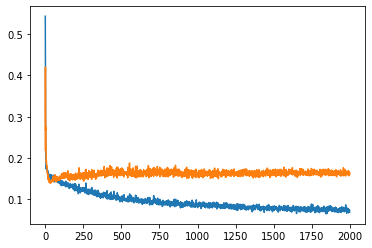

In [49]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [50]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_norm_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [51]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.12314040746096039


# Make predictions based on test set and get a root mean squared error 

In [52]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_norm_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [53]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2180669098600621


# Plot train labels along with train predictions

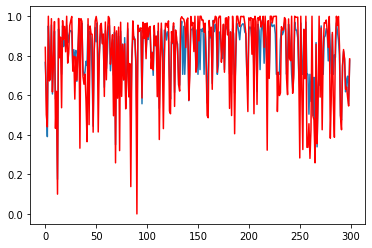

In [54]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

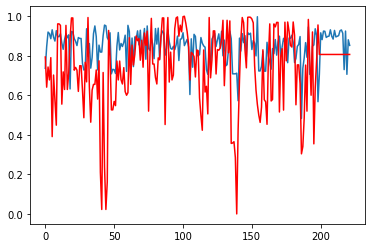

In [55]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [56]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [57]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [58]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [59]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [60]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [61]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [62]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [63]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [64]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [65]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [66]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [67]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [68]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [69]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [70]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [71]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [72]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [73]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [74]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_weather_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_weather_model.summary())

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_14 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_15 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_16 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [75]:
from tensorflow import keras

multi_channel_cnn_weather_model.compile(loss='mae', optimizer='adam')

# Train model

In [76]:
history = multi_channel_cnn_weather_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 100.5289 - val_loss: 21.1379
Epoch 2/2000
10/10 - 0s - loss: 27.1414 - val_loss: 13.3180
Epoch 3/2000
10/10 - 0s - loss: 8.5171 - val_loss: 11.8969
Epoch 4/2000
10/10 - 0s - loss: 7.2193 - val_loss: 10.5735
Epoch 5/2000
10/10 - 0s - loss: 3.1728 - val_loss: 8.5615
Epoch 6/2000
10/10 - 0s - loss: 2.5240 - val_loss: 9.5317
Epoch 7/2000
10/10 - 0s - loss: 3.9442 - val_loss: 9.0727
Epoch 8/2000
10/10 - 0s - loss: 2.2447 - val_loss: 9.5473
Epoch 9/2000
10/10 - 0s - loss: 2.0702 - val_loss: 9.1728
Epoch 10/2000
10/10 - 0s - loss: 2.8872 - val_loss: 9.0309
Epoch 11/2000
10/10 - 0s - loss: 2.0669 - val_loss: 9.1828
Epoch 12/2000
10/10 - 0s - loss: 2.2783 - val_loss: 8.5611
Epoch 13/2000
10/10 - 0s - loss: 1.9390 - val_loss: 9.4666
Epoch 14/2000
10/10 - 0s - loss: 2.2449 - val_loss: 9.1998
Epoch 15/2000
10/10 - 0s - loss: 2.2401 - val_loss: 8.9829
Epoch 16/2000
10/10 - 0s - loss: 1.7483 - val_loss: 8.7600
Epoch 17/2000
10/10 - 0s - loss: 1.7018 - val_loss: 8.6147

Epoch 140/2000
10/10 - 0s - loss: 0.5732 - val_loss: 9.1302
Epoch 141/2000
10/10 - 0s - loss: 0.5247 - val_loss: 9.0549
Epoch 142/2000
10/10 - 0s - loss: 0.4620 - val_loss: 8.9550
Epoch 143/2000
10/10 - 0s - loss: 0.3613 - val_loss: 8.9277
Epoch 144/2000
10/10 - 0s - loss: 0.4422 - val_loss: 8.6068
Epoch 145/2000
10/10 - 0s - loss: 0.5718 - val_loss: 8.7847
Epoch 146/2000
10/10 - 0s - loss: 0.4535 - val_loss: 8.8543
Epoch 147/2000
10/10 - 0s - loss: 0.4189 - val_loss: 8.8530
Epoch 148/2000
10/10 - 0s - loss: 0.4838 - val_loss: 8.8479
Epoch 149/2000
10/10 - 0s - loss: 0.3975 - val_loss: 9.0820
Epoch 150/2000
10/10 - 0s - loss: 0.4625 - val_loss: 9.0987
Epoch 151/2000
10/10 - 0s - loss: 0.5375 - val_loss: 9.0375
Epoch 152/2000
10/10 - 0s - loss: 0.4422 - val_loss: 8.9795
Epoch 153/2000
10/10 - 0s - loss: 0.4096 - val_loss: 9.0776
Epoch 154/2000
10/10 - 0s - loss: 0.3812 - val_loss: 9.1179
Epoch 155/2000
10/10 - 0s - loss: 0.5301 - val_loss: 9.2227
Epoch 156/2000
10/10 - 0s - loss: 0.5366

Epoch 277/2000
10/10 - 0s - loss: 0.3617 - val_loss: 8.6964
Epoch 278/2000
10/10 - 0s - loss: 0.4319 - val_loss: 8.6705
Epoch 279/2000
10/10 - 0s - loss: 0.3693 - val_loss: 8.4860
Epoch 280/2000
10/10 - 0s - loss: 0.4625 - val_loss: 8.2536
Epoch 281/2000
10/10 - 0s - loss: 0.4300 - val_loss: 8.3465
Epoch 282/2000
10/10 - 0s - loss: 0.5126 - val_loss: 8.1317
Epoch 283/2000
10/10 - 0s - loss: 0.5225 - val_loss: 8.4774
Epoch 284/2000
10/10 - 0s - loss: 0.3593 - val_loss: 8.5380
Epoch 285/2000
10/10 - 0s - loss: 0.4490 - val_loss: 8.3279
Epoch 286/2000
10/10 - 0s - loss: 0.4081 - val_loss: 8.3392
Epoch 287/2000
10/10 - 0s - loss: 0.4077 - val_loss: 8.5789
Epoch 288/2000
10/10 - 0s - loss: 0.3607 - val_loss: 8.5359
Epoch 289/2000
10/10 - 0s - loss: 0.3654 - val_loss: 8.5082
Epoch 290/2000
10/10 - 0s - loss: 0.4247 - val_loss: 8.4399
Epoch 291/2000
10/10 - 0s - loss: 0.3959 - val_loss: 8.6731
Epoch 292/2000
10/10 - 0s - loss: 0.3689 - val_loss: 8.7456
Epoch 293/2000
10/10 - 0s - loss: 0.3137

Epoch 414/2000
10/10 - 0s - loss: 0.3251 - val_loss: 8.5352
Epoch 415/2000
10/10 - 0s - loss: 0.3421 - val_loss: 8.6147
Epoch 416/2000
10/10 - 0s - loss: 0.4326 - val_loss: 8.5027
Epoch 417/2000
10/10 - 0s - loss: 0.3762 - val_loss: 8.4402
Epoch 418/2000
10/10 - 0s - loss: 0.3723 - val_loss: 8.3607
Epoch 419/2000
10/10 - 0s - loss: 0.3853 - val_loss: 8.2598
Epoch 420/2000
10/10 - 0s - loss: 0.4115 - val_loss: 8.4122
Epoch 421/2000
10/10 - 0s - loss: 0.3896 - val_loss: 8.3804
Epoch 422/2000
10/10 - 0s - loss: 0.4159 - val_loss: 8.5641
Epoch 423/2000
10/10 - 0s - loss: 0.4221 - val_loss: 8.4645
Epoch 424/2000
10/10 - 0s - loss: 0.3981 - val_loss: 8.5153
Epoch 425/2000
10/10 - 0s - loss: 0.3924 - val_loss: 8.3949
Epoch 426/2000
10/10 - 0s - loss: 0.3570 - val_loss: 8.3022
Epoch 427/2000
10/10 - 0s - loss: 0.5715 - val_loss: 8.1780
Epoch 428/2000
10/10 - 0s - loss: 0.4351 - val_loss: 8.2954
Epoch 429/2000
10/10 - 0s - loss: 0.3828 - val_loss: 8.1388
Epoch 430/2000
10/10 - 0s - loss: 0.5614

Epoch 551/2000
10/10 - 0s - loss: 0.4378 - val_loss: 8.2680
Epoch 552/2000
10/10 - 0s - loss: 0.3281 - val_loss: 8.5336
Epoch 553/2000
10/10 - 0s - loss: 0.3754 - val_loss: 8.5377
Epoch 554/2000
10/10 - 0s - loss: 0.3246 - val_loss: 8.2993
Epoch 555/2000
10/10 - 0s - loss: 0.4575 - val_loss: 8.4260
Epoch 556/2000
10/10 - 0s - loss: 0.4607 - val_loss: 8.7391
Epoch 557/2000
10/10 - 0s - loss: 0.6765 - val_loss: 8.7366
Epoch 558/2000
10/10 - 0s - loss: 0.3880 - val_loss: 8.6202
Epoch 559/2000
10/10 - 0s - loss: 0.3691 - val_loss: 8.8418
Epoch 560/2000
10/10 - 0s - loss: 0.5140 - val_loss: 8.4875
Epoch 561/2000
10/10 - 0s - loss: 0.3222 - val_loss: 8.3735
Epoch 562/2000
10/10 - 0s - loss: 0.3614 - val_loss: 8.5046
Epoch 563/2000
10/10 - 0s - loss: 0.3051 - val_loss: 8.5033
Epoch 564/2000
10/10 - 0s - loss: 0.3412 - val_loss: 8.4901
Epoch 565/2000
10/10 - 0s - loss: 0.3068 - val_loss: 8.3978
Epoch 566/2000
10/10 - 0s - loss: 0.2903 - val_loss: 8.4703
Epoch 567/2000
10/10 - 0s - loss: 0.2887

Epoch 688/2000
10/10 - 0s - loss: 0.4551 - val_loss: 8.1740
Epoch 689/2000
10/10 - 0s - loss: 0.3929 - val_loss: 8.2334
Epoch 690/2000
10/10 - 0s - loss: 0.3367 - val_loss: 8.2107
Epoch 691/2000
10/10 - 0s - loss: 0.3324 - val_loss: 8.2928
Epoch 692/2000
10/10 - 0s - loss: 0.3207 - val_loss: 8.3513
Epoch 693/2000
10/10 - 0s - loss: 0.2841 - val_loss: 8.3480
Epoch 694/2000
10/10 - 0s - loss: 0.2935 - val_loss: 8.2677
Epoch 695/2000
10/10 - 0s - loss: 0.3485 - val_loss: 8.2389
Epoch 696/2000
10/10 - 0s - loss: 0.3280 - val_loss: 8.3608
Epoch 697/2000
10/10 - 0s - loss: 0.3023 - val_loss: 8.2330
Epoch 698/2000
10/10 - 0s - loss: 0.3351 - val_loss: 8.3865
Epoch 699/2000
10/10 - 0s - loss: 0.3541 - val_loss: 8.4014
Epoch 700/2000
10/10 - 0s - loss: 0.2777 - val_loss: 8.5118
Epoch 701/2000
10/10 - 0s - loss: 0.3586 - val_loss: 8.4907
Epoch 702/2000
10/10 - 0s - loss: 0.3245 - val_loss: 8.4755
Epoch 703/2000
10/10 - 0s - loss: 0.3690 - val_loss: 8.3629
Epoch 704/2000
10/10 - 0s - loss: 0.3144

Epoch 825/2000
10/10 - 0s - loss: 0.3940 - val_loss: 8.0349
Epoch 826/2000
10/10 - 0s - loss: 0.3822 - val_loss: 8.0446
Epoch 827/2000
10/10 - 0s - loss: 0.3614 - val_loss: 8.0933
Epoch 828/2000
10/10 - 0s - loss: 0.3001 - val_loss: 8.2718
Epoch 829/2000
10/10 - 0s - loss: 0.2969 - val_loss: 8.2317
Epoch 830/2000
10/10 - 0s - loss: 0.3090 - val_loss: 8.2929
Epoch 831/2000
10/10 - 0s - loss: 0.3184 - val_loss: 8.2598
Epoch 832/2000
10/10 - 0s - loss: 0.3000 - val_loss: 8.3138
Epoch 833/2000
10/10 - 0s - loss: 0.3228 - val_loss: 8.3158
Epoch 834/2000
10/10 - 0s - loss: 0.2993 - val_loss: 8.1031
Epoch 835/2000
10/10 - 0s - loss: 0.3670 - val_loss: 7.9708
Epoch 836/2000
10/10 - 0s - loss: 0.4172 - val_loss: 7.9748
Epoch 837/2000
10/10 - 0s - loss: 0.3933 - val_loss: 7.9385
Epoch 838/2000
10/10 - 0s - loss: 0.4817 - val_loss: 8.0875
Epoch 839/2000
10/10 - 0s - loss: 0.3616 - val_loss: 8.1065
Epoch 840/2000
10/10 - 0s - loss: 0.3305 - val_loss: 8.2750
Epoch 841/2000
10/10 - 0s - loss: 0.3348

Epoch 962/2000
10/10 - 0s - loss: 0.3372 - val_loss: 8.1001
Epoch 963/2000
10/10 - 0s - loss: 0.3666 - val_loss: 7.9879
Epoch 964/2000
10/10 - 0s - loss: 0.3869 - val_loss: 7.9576
Epoch 965/2000
10/10 - 0s - loss: 0.3458 - val_loss: 7.9838
Epoch 966/2000
10/10 - 0s - loss: 0.3209 - val_loss: 8.0331
Epoch 967/2000
10/10 - 0s - loss: 0.3155 - val_loss: 8.1562
Epoch 968/2000
10/10 - 0s - loss: 0.3507 - val_loss: 8.1248
Epoch 969/2000
10/10 - 0s - loss: 0.3554 - val_loss: 8.1617
Epoch 970/2000
10/10 - 0s - loss: 0.2991 - val_loss: 8.0934
Epoch 971/2000
10/10 - 0s - loss: 0.2963 - val_loss: 8.3061
Epoch 972/2000
10/10 - 0s - loss: 0.3106 - val_loss: 8.0502
Epoch 973/2000
10/10 - 0s - loss: 0.3101 - val_loss: 8.1797
Epoch 974/2000
10/10 - 0s - loss: 0.3919 - val_loss: 8.3581
Epoch 975/2000
10/10 - 0s - loss: 0.3725 - val_loss: 8.4371
Epoch 976/2000
10/10 - 0s - loss: 0.3120 - val_loss: 8.2678
Epoch 977/2000
10/10 - 0s - loss: 0.3027 - val_loss: 8.2990
Epoch 978/2000
10/10 - 0s - loss: 0.2967

Epoch 1097/2000
10/10 - 0s - loss: 0.2941 - val_loss: 8.0400
Epoch 1098/2000
10/10 - 0s - loss: 0.2949 - val_loss: 7.9778
Epoch 1099/2000
10/10 - 0s - loss: 0.3530 - val_loss: 7.8890
Epoch 1100/2000
10/10 - 0s - loss: 0.4360 - val_loss: 7.6732
Epoch 1101/2000
10/10 - 0s - loss: 0.4419 - val_loss: 7.7819
Epoch 1102/2000
10/10 - 0s - loss: 0.3836 - val_loss: 7.8309
Epoch 1103/2000
10/10 - 0s - loss: 0.4169 - val_loss: 7.8793
Epoch 1104/2000
10/10 - 0s - loss: 0.3095 - val_loss: 8.0197
Epoch 1105/2000
10/10 - 0s - loss: 0.3005 - val_loss: 8.1478
Epoch 1106/2000
10/10 - 0s - loss: 0.2889 - val_loss: 8.2555
Epoch 1107/2000
10/10 - 0s - loss: 0.3084 - val_loss: 8.1854
Epoch 1108/2000
10/10 - 0s - loss: 0.3604 - val_loss: 8.3144
Epoch 1109/2000
10/10 - 0s - loss: 0.3569 - val_loss: 8.3741
Epoch 1110/2000
10/10 - 0s - loss: 0.4400 - val_loss: 8.2512
Epoch 1111/2000
10/10 - 0s - loss: 0.3600 - val_loss: 8.1462
Epoch 1112/2000
10/10 - 0s - loss: 0.3111 - val_loss: 8.1895
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.3163 - val_loss: 8.0050
Epoch 1233/2000
10/10 - 0s - loss: 0.3151 - val_loss: 7.9170
Epoch 1234/2000
10/10 - 0s - loss: 0.3791 - val_loss: 8.0787
Epoch 1235/2000
10/10 - 0s - loss: 0.3071 - val_loss: 8.0378
Epoch 1236/2000
10/10 - 0s - loss: 0.3172 - val_loss: 8.0408
Epoch 1237/2000
10/10 - 0s - loss: 0.2825 - val_loss: 7.9791
Epoch 1238/2000
10/10 - 0s - loss: 0.2737 - val_loss: 7.8905
Epoch 1239/2000
10/10 - 0s - loss: 0.3444 - val_loss: 8.0532
Epoch 1240/2000
10/10 - 0s - loss: 0.2900 - val_loss: 8.1146
Epoch 1241/2000
10/10 - 0s - loss: 0.3141 - val_loss: 8.2503
Epoch 1242/2000
10/10 - 0s - loss: 0.3636 - val_loss: 8.1407
Epoch 1243/2000
10/10 - 0s - loss: 0.2556 - val_loss: 7.9779
Epoch 1244/2000
10/10 - 0s - loss: 0.3011 - val_loss: 7.9198
Epoch 1245/2000
10/10 - 0s - loss: 0.3857 - val_loss: 7.7678
Epoch 1246/2000
10/10 - 0s - loss: 0.4691 - val_loss: 7.8463
Epoch 1247/2000
10/10 - 0s - loss: 0.3287 - val_loss: 7.8813
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.3319 - val_loss: 7.7711
Epoch 1368/2000
10/10 - 0s - loss: 0.3378 - val_loss: 7.7795
Epoch 1369/2000
10/10 - 0s - loss: 0.3009 - val_loss: 7.8299
Epoch 1370/2000
10/10 - 0s - loss: 0.3064 - val_loss: 7.8946
Epoch 1371/2000
10/10 - 0s - loss: 0.3081 - val_loss: 7.9264
Epoch 1372/2000
10/10 - 0s - loss: 0.2723 - val_loss: 8.0041
Epoch 1373/2000
10/10 - 0s - loss: 0.2615 - val_loss: 7.9273
Epoch 1374/2000
10/10 - 0s - loss: 0.2797 - val_loss: 7.8386
Epoch 1375/2000
10/10 - 0s - loss: 0.2984 - val_loss: 7.8618
Epoch 1376/2000
10/10 - 0s - loss: 0.3235 - val_loss: 7.6793
Epoch 1377/2000
10/10 - 0s - loss: 0.4204 - val_loss: 7.9005
Epoch 1378/2000
10/10 - 0s - loss: 0.3066 - val_loss: 7.8897
Epoch 1379/2000
10/10 - 0s - loss: 0.3395 - val_loss: 8.1235
Epoch 1380/2000
10/10 - 0s - loss: 0.3658 - val_loss: 8.1028
Epoch 1381/2000
10/10 - 0s - loss: 0.3598 - val_loss: 8.0244
Epoch 1382/2000
10/10 - 0s - loss: 0.3659 - val_loss: 7.9731
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.3045 - val_loss: 7.7597
Epoch 1503/2000
10/10 - 0s - loss: 0.2894 - val_loss: 7.7711
Epoch 1504/2000
10/10 - 0s - loss: 0.2912 - val_loss: 7.6916
Epoch 1505/2000
10/10 - 0s - loss: 0.4068 - val_loss: 7.7328
Epoch 1506/2000
10/10 - 0s - loss: 0.4110 - val_loss: 7.8805
Epoch 1507/2000
10/10 - 0s - loss: 0.2930 - val_loss: 7.8688
Epoch 1508/2000
10/10 - 0s - loss: 0.2792 - val_loss: 7.8384
Epoch 1509/2000
10/10 - 0s - loss: 0.2895 - val_loss: 7.7919
Epoch 1510/2000
10/10 - 0s - loss: 0.3170 - val_loss: 7.8344
Epoch 1511/2000
10/10 - 0s - loss: 0.2724 - val_loss: 7.7473
Epoch 1512/2000
10/10 - 0s - loss: 0.3127 - val_loss: 7.7439
Epoch 1513/2000
10/10 - 0s - loss: 0.2833 - val_loss: 7.8458
Epoch 1514/2000
10/10 - 0s - loss: 0.2697 - val_loss: 8.0265
Epoch 1515/2000
10/10 - 0s - loss: 0.3210 - val_loss: 7.7164
Epoch 1516/2000
10/10 - 0s - loss: 0.2998 - val_loss: 7.8450
Epoch 1517/2000
10/10 - 0s - loss: 0.2733 - val_loss: 7.8612
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.3013 - val_loss: 7.6969
Epoch 1638/2000
10/10 - 0s - loss: 0.2958 - val_loss: 7.7925
Epoch 1639/2000
10/10 - 0s - loss: 0.3201 - val_loss: 7.8762
Epoch 1640/2000
10/10 - 0s - loss: 0.4172 - val_loss: 7.6244
Epoch 1641/2000
10/10 - 0s - loss: 0.3465 - val_loss: 7.6744
Epoch 1642/2000
10/10 - 0s - loss: 0.3656 - val_loss: 7.7493
Epoch 1643/2000
10/10 - 0s - loss: 0.3378 - val_loss: 7.7733
Epoch 1644/2000
10/10 - 0s - loss: 0.3652 - val_loss: 7.6814
Epoch 1645/2000
10/10 - 0s - loss: 0.3485 - val_loss: 7.6362
Epoch 1646/2000
10/10 - 0s - loss: 0.3412 - val_loss: 7.5791
Epoch 1647/2000
10/10 - 0s - loss: 0.3222 - val_loss: 7.6249
Epoch 1648/2000
10/10 - 0s - loss: 0.3195 - val_loss: 7.5437
Epoch 1649/2000
10/10 - 0s - loss: 0.4720 - val_loss: 7.6798
Epoch 1650/2000
10/10 - 0s - loss: 0.3988 - val_loss: 7.7584
Epoch 1651/2000
10/10 - 0s - loss: 0.2965 - val_loss: 7.7215
Epoch 1652/2000
10/10 - 0s - loss: 0.2646 - val_loss: 7.8468
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.2852 - val_loss: 7.9155
Epoch 1773/2000
10/10 - 0s - loss: 0.3075 - val_loss: 7.9996
Epoch 1774/2000
10/10 - 0s - loss: 0.3074 - val_loss: 7.8759
Epoch 1775/2000
10/10 - 0s - loss: 0.3007 - val_loss: 7.8711
Epoch 1776/2000
10/10 - 0s - loss: 0.2513 - val_loss: 7.8148
Epoch 1777/2000
10/10 - 0s - loss: 0.2736 - val_loss: 7.8059
Epoch 1778/2000
10/10 - 0s - loss: 0.2713 - val_loss: 7.7648
Epoch 1779/2000
10/10 - 0s - loss: 0.3176 - val_loss: 7.7609
Epoch 1780/2000
10/10 - 0s - loss: 0.3348 - val_loss: 7.8644
Epoch 1781/2000
10/10 - 0s - loss: 0.2916 - val_loss: 7.8675
Epoch 1782/2000
10/10 - 0s - loss: 0.2717 - val_loss: 7.7786
Epoch 1783/2000
10/10 - 0s - loss: 0.3313 - val_loss: 7.8063
Epoch 1784/2000
10/10 - 0s - loss: 0.2963 - val_loss: 7.7236
Epoch 1785/2000
10/10 - 0s - loss: 0.2609 - val_loss: 7.7614
Epoch 1786/2000
10/10 - 0s - loss: 0.2875 - val_loss: 7.7993
Epoch 1787/2000
10/10 - 0s - loss: 0.3019 - val_loss: 7.8594
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.2784 - val_loss: 7.6663
Epoch 1908/2000
10/10 - 0s - loss: 0.2545 - val_loss: 7.7581
Epoch 1909/2000
10/10 - 0s - loss: 0.3161 - val_loss: 7.8009
Epoch 1910/2000
10/10 - 0s - loss: 0.2543 - val_loss: 7.7893
Epoch 1911/2000
10/10 - 0s - loss: 0.3081 - val_loss: 7.8214
Epoch 1912/2000
10/10 - 0s - loss: 0.3030 - val_loss: 7.8159
Epoch 1913/2000
10/10 - 0s - loss: 0.2834 - val_loss: 7.8178
Epoch 1914/2000
10/10 - 0s - loss: 0.2845 - val_loss: 7.8256
Epoch 1915/2000
10/10 - 0s - loss: 0.2513 - val_loss: 7.6679
Epoch 1916/2000
10/10 - 0s - loss: 0.2938 - val_loss: 7.7068
Epoch 1917/2000
10/10 - 0s - loss: 0.2857 - val_loss: 7.7483
Epoch 1918/2000
10/10 - 0s - loss: 0.2602 - val_loss: 7.6638
Epoch 1919/2000
10/10 - 0s - loss: 0.2883 - val_loss: 7.6814
Epoch 1920/2000
10/10 - 0s - loss: 0.2756 - val_loss: 7.8316
Epoch 1921/2000
10/10 - 0s - loss: 0.2873 - val_loss: 7.9037
Epoch 1922/2000
10/10 - 0s - loss: 0.2742 - val_loss: 7.6964
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

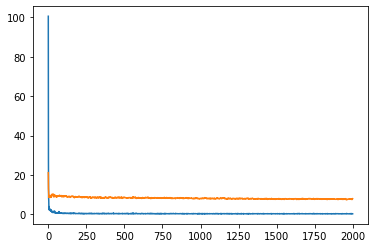

In [77]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [78]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_weather_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [79]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 6.882397616071633


# Make predictions based on test set and get a root mean squared error 

In [80]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_weather_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [81]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 11.131401887099637


# Plot train labels along with train predictions

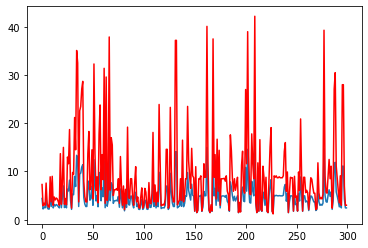

In [82]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

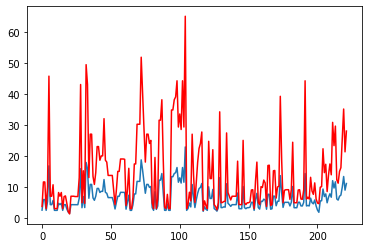

In [83]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [84]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [85]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [86]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [87]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [88]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [89]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [90]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [91]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [92]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [93]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [94]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [95]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [96]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [97]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [98]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Perform train test split for dataset

# Must split multivariate time series into individual univariate time series to be fed into each channel in the model

In [99]:
train_X1 = []
train_X2 = []
train_X3 = []
train_X4 = []
train_X5 = []
train_X6 = []

for i in train_X:
    train_X1.append([x[0] for x in i])
    train_X2.append([x[1] for x in i])
    train_X3.append([x[2] for x in i])
    train_X4.append([x[3] for x in i])
    train_X5.append([x[4] for x in i])
    train_X6.append([x[5] for x in i])

In [100]:
np.array(train_X2).shape

train_X1 = np.array(train_X1)
train_X2 = np.array(train_X2)
train_X3 = np.array(train_X3)
train_X4 = np.array(train_X4)
train_X5 = np.array(train_X5)
train_X6 = np.array(train_X6)

In [101]:
test_X1 = []
test_X2 = []
test_X3 = []
test_X4 = []
test_X5 = []
test_X6 = []

for i in test_X:
    test_X1.append([x[0] for x in i])
    test_X2.append([x[1] for x in i])
    test_X3.append([x[2] for x in i])
    test_X4.append([x[3] for x in i])
    test_X5.append([x[4] for x in i])
    test_X6.append([x[5] for x in i])

In [102]:
np.array(train_X2).shape

test_X1 = np.array(test_X1)
test_X2 = np.array(test_X2)
test_X3 = np.array(test_X3)
test_X4 = np.array(test_X4)
test_X5 = np.array(test_X5)
test_X6 = np.array(test_X6)

# Build multi-channel cnn model

In [103]:
### Build a channel for each of the 6 variables

# channel 1
inputs1 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv1 = tf.keras.layers.Conv1D(filters=8, kernel_size=5, activation='relu')(inputs1)
drop1 = tf.keras.layers.Dropout(0.5)(conv1)
pool1 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1)
conv1_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool1)
drop1_2 = tf.keras.layers.Dropout(0.5)(conv1_2)
pool1_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop1_2)
flat1 = tf.keras.layers.Flatten()(pool1_2)

# channel 2
inputs2 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv2 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs2)
drop2 = tf.keras.layers.Dropout(0.5)(conv2)
pool2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2)
conv2_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool2)
drop2_2 = tf.keras.layers.Dropout(0.5)(conv2_2)
pool2_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop2_2)
flat2 = tf.keras.layers.Flatten()(pool2_2)

# channel 3
inputs3 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv3 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs3)
drop3 = tf.keras.layers.Dropout(0.5)(conv3)
pool3 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3)
conv3_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool3)
drop3_2 = tf.keras.layers.Dropout(0.5)(conv3_2)
pool3_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop3_2)
flat3 = tf.keras.layers.Flatten()(pool3_2)

# channel 4
inputs4 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv4 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs4)
drop4 = tf.keras.layers.Dropout(0.5)(conv4)
pool4 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4)
conv4_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool4)
drop4_2 = tf.keras.layers.Dropout(0.5)(conv4_2)
pool4_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop4_2)
flat4 = tf.keras.layers.Flatten()(pool4_2)

# channel 5
inputs5 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv5 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs5)
drop5 = tf.keras.layers.Dropout(0.5)(conv5)
pool5 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5)
conv5_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool5)
drop5_2 = tf.keras.layers.Dropout(0.5)(conv5_2)
pool5_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop5_2)
flat5 = tf.keras.layers.Flatten()(pool5_2)

# channel 6
inputs6 = tf.keras.Input(shape=(train_X.shape[1], 1))
conv6 = tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu')(inputs6)
drop6 = tf.keras.layers.Dropout(0.5)(conv6)
pool6 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6)
conv6_2 = tf.keras.layers.Conv1D(filters=4, kernel_size=5, activation='relu')(pool6)
drop6_2 = tf.keras.layers.Dropout(0.5)(conv6_2)
pool6_2 = tf.keras.layers.MaxPooling1D(pool_size=2)(drop6_2)
flat6 = tf.keras.layers.Flatten()(pool6_2)

# merge
merged = tf.keras.layers.concatenate([flat1, flat2, flat3, flat4, flat5, flat6])

# dense output layers
dense1 = tf.keras.layers.Dense(units=732, activation='relu')(merged)
output = tf.keras.layers.Dense(units=1)(dense1)

multi_channel_cnn_both_model = tf.keras.Model(inputs=[inputs1, inputs2, inputs3, inputs4, inputs5, inputs6], outputs=output)

print(multi_channel_cnn_both_model.summary())

Model: "functional_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_20 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_21 (InputLayer)           [(None, 21, 1)]      0                                            
__________________________________________________________________________________________________
input_22 (InputLayer)           [(None, 21, 1)]      0                                            
_______________________________________________________________________________________

# Compile model

In [104]:
from tensorflow import keras

multi_channel_cnn_both_model.compile(loss='mae', optimizer='adam')

# Train model

In [105]:
history = multi_channel_cnn_both_model.fit([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6], train_y, epochs=2000, batch_size=32, 
                                      validation_data=([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6], test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 0s - loss: 0.1560 - val_loss: 0.1488
Epoch 2/2000
10/10 - 0s - loss: 0.1404 - val_loss: 0.1393
Epoch 3/2000
10/10 - 0s - loss: 0.1358 - val_loss: 0.1410
Epoch 4/2000
10/10 - 0s - loss: 0.1236 - val_loss: 0.1376
Epoch 5/2000
10/10 - 0s - loss: 0.1284 - val_loss: 0.1366
Epoch 6/2000
10/10 - 0s - loss: 0.1247 - val_loss: 0.1359
Epoch 7/2000
10/10 - 0s - loss: 0.1337 - val_loss: 0.1362
Epoch 8/2000
10/10 - 0s - loss: 0.1317 - val_loss: 0.1335
Epoch 9/2000
10/10 - 0s - loss: 0.1275 - val_loss: 0.1345
Epoch 10/2000
10/10 - 0s - loss: 0.1238 - val_loss: 0.1337
Epoch 11/2000
10/10 - 0s - loss: 0.1217 - val_loss: 0.1355
Epoch 12/2000
10/10 - 0s - loss: 0.1232 - val_loss: 0.1331
Epoch 13/2000
10/10 - 0s - loss: 0.1201 - val_loss: 0.1320
Epoch 14/2000
10/10 - 0s - loss: 0.1168 - val_loss: 0.1352
Epoch 15/2000
10/10 - 0s - loss: 0.1172 - val_loss: 0.1355
Epoch 16/2000
10/10 - 0s - loss: 0.1166 - val_loss: 0.1349
Epoch 17/2000
10/10 - 0s - loss: 0.1168 - val_loss: 0.1314
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.0905 - val_loss: 0.1428
Epoch 141/2000
10/10 - 0s - loss: 0.0891 - val_loss: 0.1395
Epoch 142/2000
10/10 - 0s - loss: 0.0929 - val_loss: 0.1390
Epoch 143/2000
10/10 - 0s - loss: 0.0894 - val_loss: 0.1374
Epoch 144/2000
10/10 - 0s - loss: 0.0943 - val_loss: 0.1380
Epoch 145/2000
10/10 - 0s - loss: 0.0918 - val_loss: 0.1433
Epoch 146/2000
10/10 - 0s - loss: 0.0892 - val_loss: 0.1444
Epoch 147/2000
10/10 - 0s - loss: 0.0931 - val_loss: 0.1436
Epoch 148/2000
10/10 - 0s - loss: 0.0957 - val_loss: 0.1423
Epoch 149/2000
10/10 - 0s - loss: 0.0931 - val_loss: 0.1433
Epoch 150/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1421
Epoch 151/2000
10/10 - 0s - loss: 0.0916 - val_loss: 0.1435
Epoch 152/2000
10/10 - 0s - loss: 0.0912 - val_loss: 0.1445
Epoch 153/2000
10/10 - 0s - loss: 0.0893 - val_loss: 0.1445
Epoch 154/2000
10/10 - 0s - loss: 0.0902 - val_loss: 0.1435
Epoch 155/2000
10/10 - 0s - loss: 0.0888 - val_loss: 0.1440
Epoch 156/2000
10/10 - 0s - loss: 0.0876

Epoch 277/2000
10/10 - 0s - loss: 0.0842 - val_loss: 0.1474
Epoch 278/2000
10/10 - 0s - loss: 0.0817 - val_loss: 0.1463
Epoch 279/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1467
Epoch 280/2000
10/10 - 0s - loss: 0.0824 - val_loss: 0.1486
Epoch 281/2000
10/10 - 0s - loss: 0.0835 - val_loss: 0.1496
Epoch 282/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1453
Epoch 283/2000
10/10 - 0s - loss: 0.0776 - val_loss: 0.1445
Epoch 284/2000
10/10 - 0s - loss: 0.0775 - val_loss: 0.1453
Epoch 285/2000
10/10 - 0s - loss: 0.0815 - val_loss: 0.1443
Epoch 286/2000
10/10 - 0s - loss: 0.0801 - val_loss: 0.1466
Epoch 287/2000
10/10 - 0s - loss: 0.0792 - val_loss: 0.1443
Epoch 288/2000
10/10 - 0s - loss: 0.0805 - val_loss: 0.1430
Epoch 289/2000
10/10 - 0s - loss: 0.0809 - val_loss: 0.1457
Epoch 290/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1455
Epoch 291/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1459
Epoch 292/2000
10/10 - 0s - loss: 0.0736 - val_loss: 0.1427
Epoch 293/2000
10/10 - 0s - loss: 0.0774

Epoch 414/2000
10/10 - 0s - loss: 0.0709 - val_loss: 0.1463
Epoch 415/2000
10/10 - 0s - loss: 0.0701 - val_loss: 0.1467
Epoch 416/2000
10/10 - 0s - loss: 0.0764 - val_loss: 0.1428
Epoch 417/2000
10/10 - 0s - loss: 0.0775 - val_loss: 0.1439
Epoch 418/2000
10/10 - 0s - loss: 0.0800 - val_loss: 0.1467
Epoch 419/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1455
Epoch 420/2000
10/10 - 0s - loss: 0.0714 - val_loss: 0.1444
Epoch 421/2000
10/10 - 0s - loss: 0.0693 - val_loss: 0.1465
Epoch 422/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1439
Epoch 423/2000
10/10 - 0s - loss: 0.0780 - val_loss: 0.1448
Epoch 424/2000
10/10 - 0s - loss: 0.0684 - val_loss: 0.1430
Epoch 425/2000
10/10 - 0s - loss: 0.0718 - val_loss: 0.1424
Epoch 426/2000
10/10 - 0s - loss: 0.0769 - val_loss: 0.1440
Epoch 427/2000
10/10 - 0s - loss: 0.0745 - val_loss: 0.1453
Epoch 428/2000
10/10 - 0s - loss: 0.0734 - val_loss: 0.1420
Epoch 429/2000
10/10 - 0s - loss: 0.0759 - val_loss: 0.1424
Epoch 430/2000
10/10 - 0s - loss: 0.0746

Epoch 551/2000
10/10 - 0s - loss: 0.0650 - val_loss: 0.1459
Epoch 552/2000
10/10 - 0s - loss: 0.0718 - val_loss: 0.1446
Epoch 553/2000
10/10 - 0s - loss: 0.0699 - val_loss: 0.1445
Epoch 554/2000
10/10 - 0s - loss: 0.0671 - val_loss: 0.1437
Epoch 555/2000
10/10 - 0s - loss: 0.0712 - val_loss: 0.1443
Epoch 556/2000
10/10 - 0s - loss: 0.0673 - val_loss: 0.1446
Epoch 557/2000
10/10 - 0s - loss: 0.0695 - val_loss: 0.1434
Epoch 558/2000
10/10 - 0s - loss: 0.0696 - val_loss: 0.1441
Epoch 559/2000
10/10 - 0s - loss: 0.0671 - val_loss: 0.1430
Epoch 560/2000
10/10 - 0s - loss: 0.0701 - val_loss: 0.1447
Epoch 561/2000
10/10 - 0s - loss: 0.0677 - val_loss: 0.1448
Epoch 562/2000
10/10 - 0s - loss: 0.0670 - val_loss: 0.1436
Epoch 563/2000
10/10 - 0s - loss: 0.0656 - val_loss: 0.1453
Epoch 564/2000
10/10 - 0s - loss: 0.0713 - val_loss: 0.1444
Epoch 565/2000
10/10 - 0s - loss: 0.0654 - val_loss: 0.1444
Epoch 566/2000
10/10 - 0s - loss: 0.0689 - val_loss: 0.1473
Epoch 567/2000
10/10 - 0s - loss: 0.0727

Epoch 688/2000
10/10 - 0s - loss: 0.0665 - val_loss: 0.1455
Epoch 689/2000
10/10 - 0s - loss: 0.0676 - val_loss: 0.1455
Epoch 690/2000
10/10 - 0s - loss: 0.0658 - val_loss: 0.1477
Epoch 691/2000
10/10 - 0s - loss: 0.0617 - val_loss: 0.1481
Epoch 692/2000
10/10 - 0s - loss: 0.0642 - val_loss: 0.1479
Epoch 693/2000
10/10 - 0s - loss: 0.0625 - val_loss: 0.1456
Epoch 694/2000
10/10 - 0s - loss: 0.0632 - val_loss: 0.1454
Epoch 695/2000
10/10 - 0s - loss: 0.0670 - val_loss: 0.1456
Epoch 696/2000
10/10 - 0s - loss: 0.0696 - val_loss: 0.1461
Epoch 697/2000
10/10 - 0s - loss: 0.0639 - val_loss: 0.1436
Epoch 698/2000
10/10 - 0s - loss: 0.0635 - val_loss: 0.1428
Epoch 699/2000
10/10 - 0s - loss: 0.0665 - val_loss: 0.1429
Epoch 700/2000
10/10 - 0s - loss: 0.0661 - val_loss: 0.1415
Epoch 701/2000
10/10 - 0s - loss: 0.0654 - val_loss: 0.1441
Epoch 702/2000
10/10 - 0s - loss: 0.0645 - val_loss: 0.1438
Epoch 703/2000
10/10 - 0s - loss: 0.0607 - val_loss: 0.1453
Epoch 704/2000
10/10 - 0s - loss: 0.0610

Epoch 825/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1465
Epoch 826/2000
10/10 - 0s - loss: 0.0619 - val_loss: 0.1458
Epoch 827/2000
10/10 - 0s - loss: 0.0615 - val_loss: 0.1482
Epoch 828/2000
10/10 - 0s - loss: 0.0619 - val_loss: 0.1471
Epoch 829/2000
10/10 - 0s - loss: 0.0654 - val_loss: 0.1456
Epoch 830/2000
10/10 - 0s - loss: 0.0622 - val_loss: 0.1461
Epoch 831/2000
10/10 - 0s - loss: 0.0605 - val_loss: 0.1471
Epoch 832/2000
10/10 - 0s - loss: 0.0673 - val_loss: 0.1467
Epoch 833/2000
10/10 - 0s - loss: 0.0612 - val_loss: 0.1459
Epoch 834/2000
10/10 - 0s - loss: 0.0609 - val_loss: 0.1470
Epoch 835/2000
10/10 - 0s - loss: 0.0586 - val_loss: 0.1475
Epoch 836/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1445
Epoch 837/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1446
Epoch 838/2000
10/10 - 0s - loss: 0.0606 - val_loss: 0.1460
Epoch 839/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1455
Epoch 840/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1437
Epoch 841/2000
10/10 - 0s - loss: 0.0650

Epoch 962/2000
10/10 - 0s - loss: 0.0603 - val_loss: 0.1474
Epoch 963/2000
10/10 - 0s - loss: 0.0580 - val_loss: 0.1495
Epoch 964/2000
10/10 - 0s - loss: 0.0599 - val_loss: 0.1499
Epoch 965/2000
10/10 - 0s - loss: 0.0567 - val_loss: 0.1470
Epoch 966/2000
10/10 - 0s - loss: 0.0563 - val_loss: 0.1463
Epoch 967/2000
10/10 - 0s - loss: 0.0622 - val_loss: 0.1471
Epoch 968/2000
10/10 - 0s - loss: 0.0610 - val_loss: 0.1462
Epoch 969/2000
10/10 - 0s - loss: 0.0596 - val_loss: 0.1461
Epoch 970/2000
10/10 - 0s - loss: 0.0610 - val_loss: 0.1475
Epoch 971/2000
10/10 - 0s - loss: 0.0603 - val_loss: 0.1468
Epoch 972/2000
10/10 - 0s - loss: 0.0571 - val_loss: 0.1457
Epoch 973/2000
10/10 - 0s - loss: 0.0589 - val_loss: 0.1457
Epoch 974/2000
10/10 - 0s - loss: 0.0629 - val_loss: 0.1453
Epoch 975/2000
10/10 - 0s - loss: 0.0623 - val_loss: 0.1449
Epoch 976/2000
10/10 - 0s - loss: 0.0631 - val_loss: 0.1460
Epoch 977/2000
10/10 - 0s - loss: 0.0559 - val_loss: 0.1445
Epoch 978/2000
10/10 - 0s - loss: 0.0589

Epoch 1097/2000
10/10 - 0s - loss: 0.0544 - val_loss: 0.1472
Epoch 1098/2000
10/10 - 0s - loss: 0.0582 - val_loss: 0.1467
Epoch 1099/2000
10/10 - 0s - loss: 0.0633 - val_loss: 0.1475
Epoch 1100/2000
10/10 - 0s - loss: 0.0634 - val_loss: 0.1489
Epoch 1101/2000
10/10 - 0s - loss: 0.0554 - val_loss: 0.1483
Epoch 1102/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1471
Epoch 1103/2000
10/10 - 0s - loss: 0.0599 - val_loss: 0.1461
Epoch 1104/2000
10/10 - 0s - loss: 0.0576 - val_loss: 0.1455
Epoch 1105/2000
10/10 - 0s - loss: 0.0591 - val_loss: 0.1446
Epoch 1106/2000
10/10 - 0s - loss: 0.0610 - val_loss: 0.1458
Epoch 1107/2000
10/10 - 0s - loss: 0.0563 - val_loss: 0.1447
Epoch 1108/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1432
Epoch 1109/2000
10/10 - 0s - loss: 0.0568 - val_loss: 0.1435
Epoch 1110/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1439
Epoch 1111/2000
10/10 - 0s - loss: 0.0566 - val_loss: 0.1450
Epoch 1112/2000
10/10 - 0s - loss: 0.0588 - val_loss: 0.1430
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0563 - val_loss: 0.1452
Epoch 1233/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1468
Epoch 1234/2000
10/10 - 0s - loss: 0.0621 - val_loss: 0.1454
Epoch 1235/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1436
Epoch 1236/2000
10/10 - 0s - loss: 0.0538 - val_loss: 0.1449
Epoch 1237/2000
10/10 - 0s - loss: 0.0581 - val_loss: 0.1469
Epoch 1238/2000
10/10 - 0s - loss: 0.0584 - val_loss: 0.1479
Epoch 1239/2000
10/10 - 0s - loss: 0.0605 - val_loss: 0.1467
Epoch 1240/2000
10/10 - 0s - loss: 0.0654 - val_loss: 0.1450
Epoch 1241/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1447
Epoch 1242/2000
10/10 - 0s - loss: 0.0612 - val_loss: 0.1445
Epoch 1243/2000
10/10 - 0s - loss: 0.0580 - val_loss: 0.1443
Epoch 1244/2000
10/10 - 0s - loss: 0.0563 - val_loss: 0.1435
Epoch 1245/2000
10/10 - 0s - loss: 0.0597 - val_loss: 0.1457
Epoch 1246/2000
10/10 - 0s - loss: 0.0515 - val_loss: 0.1460
Epoch 1247/2000
10/10 - 0s - loss: 0.0552 - val_loss: 0.1463
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0646 - val_loss: 0.1447
Epoch 1368/2000
10/10 - 0s - loss: 0.0594 - val_loss: 0.1443
Epoch 1369/2000
10/10 - 0s - loss: 0.0583 - val_loss: 0.1450
Epoch 1370/2000
10/10 - 0s - loss: 0.0567 - val_loss: 0.1447
Epoch 1371/2000
10/10 - 0s - loss: 0.0589 - val_loss: 0.1442
Epoch 1372/2000
10/10 - 0s - loss: 0.0578 - val_loss: 0.1451
Epoch 1373/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1452
Epoch 1374/2000
10/10 - 0s - loss: 0.0554 - val_loss: 0.1452
Epoch 1375/2000
10/10 - 0s - loss: 0.0526 - val_loss: 0.1445
Epoch 1376/2000
10/10 - 0s - loss: 0.0597 - val_loss: 0.1451
Epoch 1377/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1458
Epoch 1378/2000
10/10 - 0s - loss: 0.0538 - val_loss: 0.1450
Epoch 1379/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1443
Epoch 1380/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1465
Epoch 1381/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1483
Epoch 1382/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1473
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0587 - val_loss: 0.1435
Epoch 1503/2000
10/10 - 0s - loss: 0.0558 - val_loss: 0.1442
Epoch 1504/2000
10/10 - 0s - loss: 0.0548 - val_loss: 0.1453
Epoch 1505/2000
10/10 - 0s - loss: 0.0503 - val_loss: 0.1438
Epoch 1506/2000
10/10 - 0s - loss: 0.0582 - val_loss: 0.1430
Epoch 1507/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1436
Epoch 1508/2000
10/10 - 0s - loss: 0.0587 - val_loss: 0.1438
Epoch 1509/2000
10/10 - 0s - loss: 0.0601 - val_loss: 0.1430
Epoch 1510/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1434
Epoch 1511/2000
10/10 - 0s - loss: 0.0575 - val_loss: 0.1435
Epoch 1512/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1440
Epoch 1513/2000
10/10 - 0s - loss: 0.0556 - val_loss: 0.1434
Epoch 1514/2000
10/10 - 0s - loss: 0.0534 - val_loss: 0.1439
Epoch 1515/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1442
Epoch 1516/2000
10/10 - 0s - loss: 0.0531 - val_loss: 0.1441
Epoch 1517/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1425
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0523 - val_loss: 0.1446
Epoch 1638/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1456
Epoch 1639/2000
10/10 - 0s - loss: 0.0544 - val_loss: 0.1460
Epoch 1640/2000
10/10 - 0s - loss: 0.0568 - val_loss: 0.1452
Epoch 1641/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1446
Epoch 1642/2000
10/10 - 0s - loss: 0.0547 - val_loss: 0.1428
Epoch 1643/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1427
Epoch 1644/2000
10/10 - 0s - loss: 0.0497 - val_loss: 0.1428
Epoch 1645/2000
10/10 - 0s - loss: 0.0553 - val_loss: 0.1433
Epoch 1646/2000
10/10 - 0s - loss: 0.0507 - val_loss: 0.1455
Epoch 1647/2000
10/10 - 0s - loss: 0.0574 - val_loss: 0.1437
Epoch 1648/2000
10/10 - 0s - loss: 0.0527 - val_loss: 0.1427
Epoch 1649/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1444
Epoch 1650/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1450
Epoch 1651/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1433
Epoch 1652/2000
10/10 - 0s - loss: 0.0565 - val_loss: 0.1430
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0533 - val_loss: 0.1423
Epoch 1773/2000
10/10 - 0s - loss: 0.0580 - val_loss: 0.1449
Epoch 1774/2000
10/10 - 0s - loss: 0.0555 - val_loss: 0.1447
Epoch 1775/2000
10/10 - 0s - loss: 0.0537 - val_loss: 0.1448
Epoch 1776/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1457
Epoch 1777/2000
10/10 - 0s - loss: 0.0512 - val_loss: 0.1445
Epoch 1778/2000
10/10 - 0s - loss: 0.0567 - val_loss: 0.1430
Epoch 1779/2000
10/10 - 0s - loss: 0.0511 - val_loss: 0.1438
Epoch 1780/2000
10/10 - 0s - loss: 0.0525 - val_loss: 0.1438
Epoch 1781/2000
10/10 - 0s - loss: 0.0511 - val_loss: 0.1431
Epoch 1782/2000
10/10 - 0s - loss: 0.0524 - val_loss: 0.1430
Epoch 1783/2000
10/10 - 0s - loss: 0.0480 - val_loss: 0.1429
Epoch 1784/2000
10/10 - 0s - loss: 0.0558 - val_loss: 0.1433
Epoch 1785/2000
10/10 - 0s - loss: 0.0545 - val_loss: 0.1431
Epoch 1786/2000
10/10 - 0s - loss: 0.0532 - val_loss: 0.1433
Epoch 1787/2000
10/10 - 0s - loss: 0.0479 - val_loss: 0.1442
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1431
Epoch 1908/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1437
Epoch 1909/2000
10/10 - 0s - loss: 0.0505 - val_loss: 0.1454
Epoch 1910/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1454
Epoch 1911/2000
10/10 - 0s - loss: 0.0550 - val_loss: 0.1453
Epoch 1912/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1452
Epoch 1913/2000
10/10 - 0s - loss: 0.0469 - val_loss: 0.1461
Epoch 1914/2000
10/10 - 0s - loss: 0.0537 - val_loss: 0.1455
Epoch 1915/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1456
Epoch 1916/2000
10/10 - 0s - loss: 0.0495 - val_loss: 0.1460
Epoch 1917/2000
10/10 - 0s - loss: 0.0510 - val_loss: 0.1453
Epoch 1918/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1447
Epoch 1919/2000
10/10 - 0s - loss: 0.0530 - val_loss: 0.1447
Epoch 1920/2000
10/10 - 0s - loss: 0.0501 - val_loss: 0.1457
Epoch 1921/2000
10/10 - 0s - loss: 0.0504 - val_loss: 0.1453
Epoch 1922/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1450
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

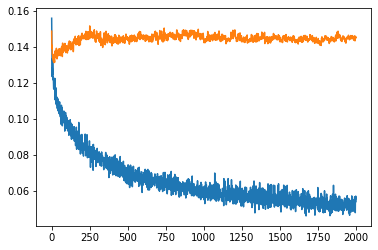

In [106]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [107]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = multi_channel_cnn_both_model.predict([train_X1, train_X2, train_X3, train_X4, train_X5,
                                      train_X6])
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [108]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.08886278155593584


# Make predictions based on test set and get a root mean squared error 

In [109]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = multi_channel_cnn_both_model.predict([test_X1, test_X2, test_X3, test_X4,
                                                        test_X5, test_X6])
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [110]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2136606868096605


# Plot train labels along with train predictions

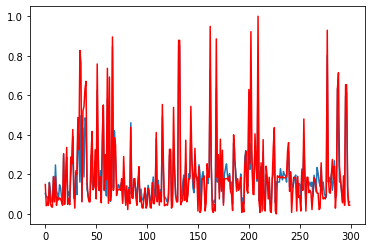

In [111]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

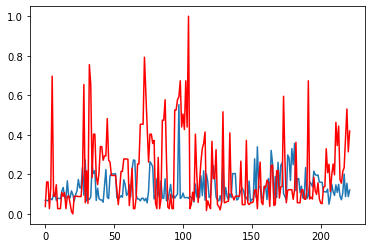

In [112]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()